In [196]:
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn.parallel
import torch.nn.functional as F
import torch.backends.cudnn as cudnn

from torchvision import transforms
import hd3model
from models.hd3_ops import *
import utils.flowlib as fl

In [197]:
def get_target_size(H, W):
    h = 64 * np.array([[H // 64, H // 64 + 1]])
    w = 64 * np.array([[W // 64, W // 64 + 1]])
    ratio = np.abs(np.matmul(np.transpose(h), 1 / w) - H / W)
    index = np.argmin(ratio)
    return h[0, index // 2], w[0, index % 2]

def flow_warp(x, flow, padding_mode='zeros'):
    """Warp an image or feature map with optical flow
    Args:
        x (Tensor): size (n, c, h, w) (image1)
        flow (Tensor): size (n, 2, h, w), values range from -1 to 1 (relevant to image width or height) (flow1->2)
        padding_mode (str): 'zeros' or 'border'

    Returns:
        Tensor: warped image or feature map
    """
    assert x.size()[-2:] == flow.size()[-2:]
    n, _, h, w = x.size()
    x_ = torch.arange(w).view(1, -1).expand(h, -1)
    y_ = torch.arange(h).view(-1, 1).expand(-1, w)
    grid = torch.stack([x_, y_], dim=0).float().cuda()
    grid = grid.unsqueeze(0).expand(n, -1, -1, -1)
    grid[:, 0, :, :] = 2 * grid[:, 0, :, :] / (w - 1) - 1
    grid[:, 1, :, :] = 2 * grid[:, 1, :, :] / (h - 1) - 1
    grid += 2 * flow
    grid = grid.permute(0, 2, 3, 1)
    return F.grid_sample(x, grid, padding_mode=padding_mode)

model = hd3model.HD3Model('flow', 'dlaup', 'hda', [4, 4, 4, 4, 4], True).cuda()
model = torch.nn.DataParallel(model).cuda()
cudnn.enabled = True
cudnn.benchmark = True
checkpoint = torch.load('model_zoo/hd3fc_chairs_things_kitti-bfa97911.pth')
model.load_state_dict(checkpoint['state_dict'], strict=True)
model.eval();

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
val_transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize(mean=mean, std=std)])

In [198]:
# image1_path = '/home/ubuntu/hdd/data/kitti/RawData/2011_09_26/2011_09_26_drive_0009_sync/image_02/data/0000000217.png'
# image2_path = '/home/ubuntu/hdd/data/kitti/RawData/2011_09_26/2011_09_26_drive_0009_sync/image_02/data/0000000218.png'
# image1_path = '/home/ubuntu/hdd/data/Cityscapes/leftImg8bit_sequence_trainvaltest/leftImg8bit_sequence/train/aachen/aachen_000020_000000_leftImg8bit.png'
# image2_path = '/home/ubuntu/hdd/data/Cityscapes/leftImg8bit_sequence_trainvaltest/leftImg8bit_sequence/train/aachen/aachen_000020_000001_leftImg8bit.png'
# image1_path = '/home/ubuntu/hdd/data/Apolloscape/Segmentation/road04_seg/ColorImage/Record021/Camera 5/171206_062301655_Camera_5.jpg'
# image2_path = '/home/ubuntu/hdd/data/Apolloscape/Segmentation/road04_seg/ColorImage/Record021/Camera 5/171206_062301924_Camera_5.jpg'
# image1_path = '/home/ubuntu/hdd/data/Argoverse/argoverse-tracking/train/00c561b9-2057-358d-82c6-5b06d76cebcf/ring_front_center/ring_front_center_315969629655213336.jpg'
# image2_path = '/home/ubuntu/hdd/data/Argoverse/argoverse-tracking/train/00c561b9-2057-358d-82c6-5b06d76cebcf/ring_front_center/ring_front_center_315969629688513224.jpg'
image1_path = '/home/ubuntu/hdd/data/kitti/odometry/dataset/sequences/00/image_2/000206.png'
image2_path = '/home/ubuntu/hdd/data/kitti/odometry/dataset/sequences/00/image_2/000207.png'

image1 = cv2.imread(image1_path)[:,:,::-1]
image2 = cv2.imread(image2_path)[:,:,::-1]
input_size = image1.shape
th, tw = 320, 1024#get_target_size(input_size[0], input_size[1])
image1_resized = cv2.resize(image1, (tw, th))
image2_resized = cv2.resize(image2, (tw, th))
image1_resized_ = transforms.ToTensor()(image1_resized).unsqueeze(0).cuda()
image2_resized_ = transforms.ToTensor()(image2_resized).unsqueeze(0).cuda()
input_image1_pytorch = val_transform(image1_resized).unsqueeze(0).cuda()
input_image2_pytorch = val_transform(image2_resized).unsqueeze(0).cuda()

In [199]:
t = time.time()
with torch.no_grad():
    output1 = model([input_image1_pytorch, input_image2_pytorch], get_prob=True)
    output2 = model([input_image2_pytorch, input_image1_pytorch], get_prob=True)
    torch.cuda.synchronize()
print(time.time()-t)

0.12812018394470215


In [200]:
scale_factor = 1/4
output1['vect_resized'] = resize_dense_vector(output1['vect'] * scale_factor, th, tw)
output1['prob_resized'] = F.interpolate(prob_gather(output1['prob']), (th, tw), mode='nearest')
output2['vect_resized'] = resize_dense_vector(output2['vect'] * scale_factor, th, tw)
output2['prob_resized'] = F.interpolate(prob_gather(output2['prob']), (th, tw), mode='nearest')

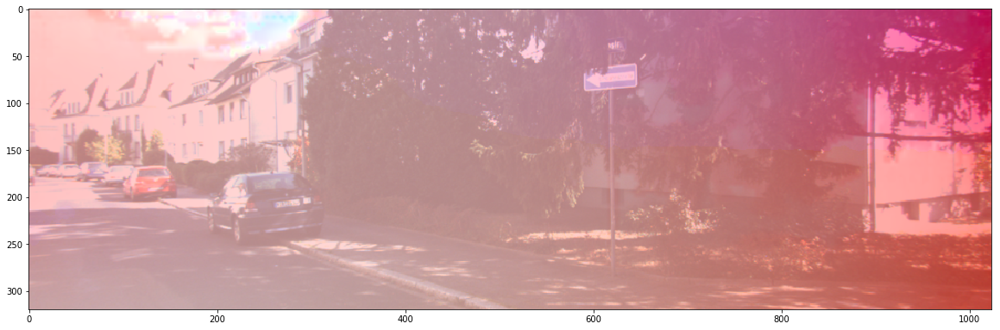

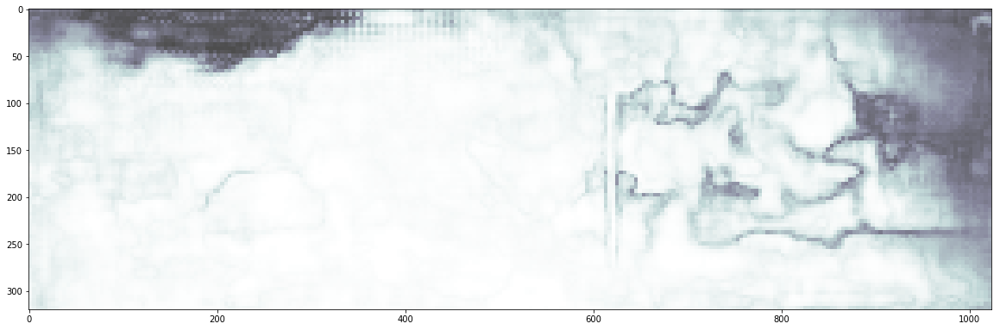

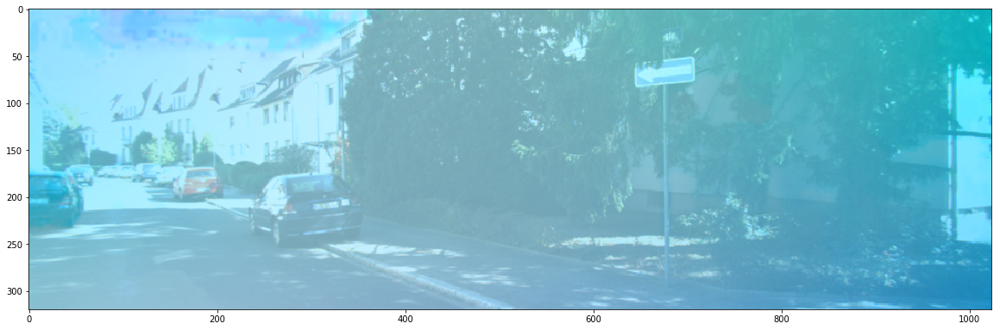

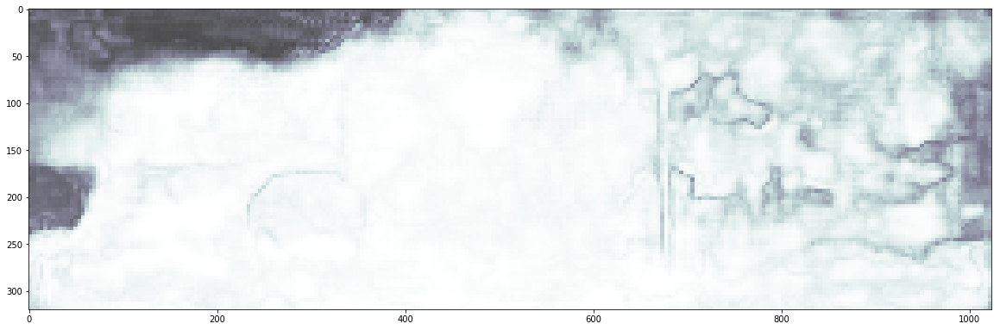

In [182]:
pred_vect1 = output1['vect_resized'].data.cpu().numpy()
pred_vect1_ = np.transpose(pred_vect1, (0, 2, 3, 1))
vis_flo1 = fl.flow_to_image(pred_vect1_[0])
pred_vect2 = output2['vect_resized'].data.cpu().numpy()
pred_vect2_ = np.transpose(pred_vect2, (0, 2, 3, 1))
vis_flo2 = fl.flow_to_image(pred_vect2_[0])
plt.figure(figsize=(20, 10))
plt.imshow(image1_resized)
plt.imshow(vis_flo1, alpha=0.7)
plt.figure(figsize=(20, 10))
plt.imshow(output1['prob_resized'].cpu().numpy().squeeze(), cmap='bone', alpha=0.7)
plt.figure(figsize=(20, 10))
plt.imshow(image2_resized)
plt.imshow(vis_flo2, alpha=0.7)
plt.figure(figsize=(20, 10))
plt.imshow(output2['prob_resized'].cpu().numpy().squeeze(), cmap='bone', alpha=0.7)

In [202]:
import yaml
# with open('/home/ubuntu/hdd/data/kitti/RawData/2011_09_26/calib_cam_to_cam.txt', 'r') as f:
#     calib_cam = yaml.load(f)
# K = np.fromstring(calib_cam['P_rect_02'], dtype=np.float32, sep=' ').reshape(3, 4)
with open('/home/ubuntu/hdd/data/kitti/odometry/dataset/sequences/00/calib.txt', 'r') as f:
    calib_cam = yaml.load(f)
K = np.fromstring(calib_cam['P2'], dtype=np.float32, sep=' ').reshape(3, 4)

# fx = 2304.54786556982
# fy = 2305.87566806200
# cx = 1686.23787612802
# cy = 1354.98486439791

# fx = 2262.52
# fy = 2265.3017905988554
# cx = 1096.98
# cy = 513.137

# K = np.array([[fx, 0, cx, 0],
#                [0, fy, cy, 0],
#                [0,        0,        1, 0],
#                [0,        0,        0, 1]], dtype=np.float32)

K[:, -1] = 0
K = np.concatenate([K, np.array([0, 0, 0, 1]).reshape(1, 4)], axis=0)
K[0] *= tw/input_size[1]
K[1] *= th/input_size[0]

kp1 = np.mgrid[:tw,:th].T.reshape(-1,2).astype(np.float32)
kp2 = pred_vect1_.reshape(-1, 2)+kp1

# mask=(output1['prob_resized'].cpu().numpy().squeeze()>0.99).astype(np.int).T.flatten()

# kp1 = kp1[mask==1]
# kp2 = kp2[mask==1]

ind = np.argsort(output1['prob_resized'].cpu().numpy().squeeze().T.flatten())[::-1][:500]
kp1 = kp1[ind]
kp2 = kp2[ind]

t = time.time()
E, _ = cv2.findEssentialMat(kp2, kp1, cameraMatrix=K[:3, :3], method=cv2.LMEDS, prob=0.999, threshold=0.1)
_, cur_R, cur_t, _ = cv2.recoverPose(E, kp2, kp1, cameraMatrix=K[:3, :3])
print(time.time()-t)
print(cur_R)
print(cur_t)

0.03701519966125488
[[ 9.99997415e-01 -2.05269862e-03  9.77608648e-04]
 [ 2.05620044e-03  9.99991425e-01 -3.59458950e-03]
 [-9.70221656e-04  3.59659037e-03  9.99993062e-01]]
[[ 0.00142314]
 [-0.01660414]
 [ 0.99986113]]


In [184]:
import pandas as pd
import os

prev_img = None
orig = np.array([0, 0, 0, 1])
pos_gt = [orig.copy()]
pos_pred = [orig.copy()]

# seg = 'road04_seg'
# record = 'Record009'
# record_dir = '/home/ubuntu/hdd/data/Apolloscape/Segmentation/%s/ColorImage/%s/Camera 5'%(seg, record)
# vid_name = '%s_%s.avi'%(seg, record)

record_dir = '/home/ubuntu/hdd/data/kitti/odometry/dataset/sequences/00/image_2/'
# vid_name = '2011_09_30_drive_0033_2.avi'

# record_dir = '/home/ubuntu/hdd/data/Cityscapes/leftImg8bit_demoVideo/leftImg8bit/demoVideo/stuttgart_02/'
# vid_name = 'stuttgart_02.avi'

# apollo pose
# pose_gt = pd.read_csv('/home/ubuntu/hdd/data/Apolloscape/Segmentation/%s/Pose/%s/Camera 5/pose.txt'%(seg, record), sep=' ', header=None)
# pose_gt.sort_values(16, inplace=True)
# pose_gt.drop(pose_gt.columns[16], axis=1, inplace=True)
# pose_gt = np.array(pose_gt, dtype=np.float32).reshape(-1, 4, 4)

# kitti pose
pose_gt = pd.read_csv('/home/ubuntu/hdd/data/kitti/odometry/dataset/poses/00.txt', sep=' ', header=None)
pose_gt[12] = 0
pose_gt[13] = 0
pose_gt[14] = 0
pose_gt[15] = 1
pose_gt = np.array(pose_gt, dtype=np.float32).reshape(-1, 4, 4)

# out = cv2.VideoWriter(vid_name, cv2.VideoWriter_fourcc(*'XVID'), 10.0, (feed_width*2+320,feed_height))
T_pred = []
T_gt = np.eye(4)
T_pr = np.eye(4)
for i, filename in enumerate(sorted(os.listdir(record_dir))):
    image_path = os.path.join(record_dir, filename)
    input_image = cv2.imread(image_path)[:,:,::-1]
    image_resized = cv2.resize(input_image, (tw, th))
    image_resized_ = transforms.ToTensor()(image_resized).unsqueeze(0).cuda()
    input_image_pytorch = val_transform(image_resized).unsqueeze(0).cuda()
    
    with torch.no_grad():
        if prev_img is not None:
            output1 = model([prev_img, input_image_pytorch], get_prob=True)
            output1['vect_resized'] = resize_dense_vector(output1['vect'] * scale_factor, th, tw)
            output1['prob_resized'] = F.interpolate(prob_gather(output1['prob']), (th, tw), mode='nearest')
            pred_vect1 = output1['vect_resized'].data.cpu().numpy()
            pred_vect1_ = np.transpose(pred_vect1, (0, 2, 3, 1))
            pred_prob1 = output1['prob_resized'].cpu().numpy().squeeze()
            kp1 = np.mgrid[:tw,:th].T.reshape(-1,2).astype(np.float32)
            kp2 = pred_vect1_.reshape(-1, 2)+kp1
            mask = (pred_prob1>0.99).astype(np.int).T.flatten()
            ind = np.random.choice(np.sum(mask==1), 500)
            kp1 = kp1[mask==1][ind]
            kp2 = kp2[mask==1][ind]
            E, _ = cv2.findEssentialMat(kp2, kp1, cameraMatrix=K[:3, :3], method=cv2.LMEDS, prob=0.999, threshold=0.1)
            _, cur_R, cur_t, _ = cv2.recoverPose(E, kp2, kp1, cameraMatrix=K[:3, :3])
            T_ = np.eye(4)
            T_[:3, :3] = cur_R
            T_[:3, -1:] = cur_t
            T_pred += [T_]
    
    prev_img = input_image_pytorch
    print('\r', i+1, len(os.listdir(record_dir)), end=' '*10)
    
#     if i == 4540:
#         break

 4541 4541          

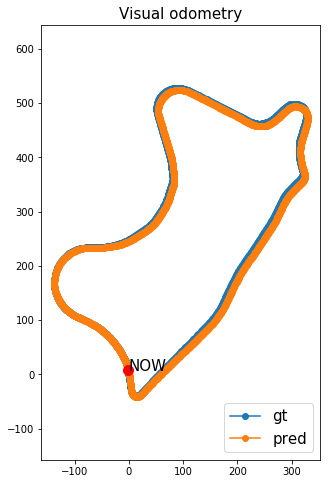

In [178]:
pos_gt = [orig.copy()]
pos_pred = [orig.copy()]

prev_imu_data = None
timestamps = pd.read_csv('/home/ubuntu/hdd/data/kitti/RawData/2011_10_03/2011_10_03_drive_0027_sync/oxts/timestamps.txt', header=None, sep=' ')

T_gt = np.eye(4)
T_pr = np.eye(4)
for i in range(1, len(pose_gt)):
    try:
        T_gt = T_gt.dot(np.linalg.inv(pose_gt[i-1]).dot(pose_gt[i]))
        scale = np.linalg.norm((np.linalg.inv(pose_gt[i-1]).dot(pose_gt[i]))[:3, -1])
        imu_data = pd.read_csv('/home/ubuntu/hdd/data/kitti/RawData/2011_10_03/2011_10_03_drive_0027_sync/oxts/data/%010d.txt'%(i-1), header=None, sep=' ')
        sec = (timestamps[i]-timestamps[i-1]).total_seconds()
        if prev_imu_data is None:
            vdt = np.linalg.norm(imu_data[[8, 9, 10]])*sec
        else:
            vdt = np.linalg.norm(imu_data[[8, 9, 10]]+prev_imu_data[[8, 9, 10]])*0.5*sec
        T_pred_ = T_pred[i-1].copy()
        T_pred_[:3, -1]*=scale
        T_pr = T_pr.dot(T_pred_)
        pos_gt += [T_gt[:,-1]]
        pos_pred += [T_pr[:,-1]]
        prev_imu_data = imu_data
    except:
        break
    
pos_gt = np.array(pos_gt)
plt.figure(figsize=(5, 8))
plt.title("Visual odometry", fontsize=15)
ax = plt.gca()
ax.set_aspect('equal', adjustable='datalim')
plt.plot(pos_gt[:, 0], pos_gt[:, 2], '-o', label='gt')
pos_pred = np.array(pos_pred)
plt.plot(pos_pred[:, 0], pos_pred[:, 2], '-o', label='pred')
plt.scatter(pos_pred[-1, 0], pos_pred[-1, 2], color='r', s=100, zorder=10)
plt.text(pos_pred[-1, 0], pos_pred[-1, 2], 'NOW', fontsize=15, zorder=20)
plt.legend(loc=4, fontsize=15);

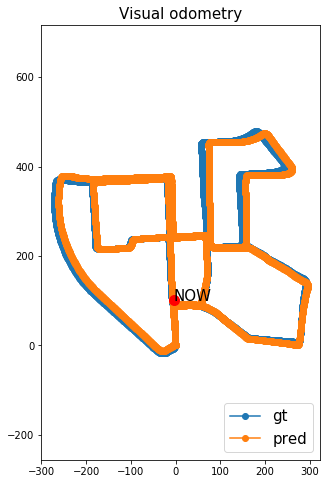

In [193]:
pos_gt = [orig.copy()]
pos_pred = [orig.copy()]

prev_imu_data = None
timestamps = pd.read_csv('/home/ubuntu/hdd/data/kitti/RawData/2011_10_03/2011_10_03_drive_0027_sync/oxts/timestamps.txt', header=None, sep=' ')
timestamps = pd.to_datetime(timestamps[1])

T_gt = np.eye(4)
T_pr = np.eye(4)
for i in range(1, len(pose_gt)):
    try:
        T_gt = T_gt.dot(np.linalg.inv(pose_gt[i-1]).dot(pose_gt[i]))
        scale = np.linalg.norm((np.linalg.inv(pose_gt[i-1]).dot(pose_gt[i]))[:3, -1])
        imu_data = pd.read_csv('/home/ubuntu/hdd/data/kitti/RawData/2011_10_03/2011_10_03_drive_0027_sync/oxts/data/%010d.txt'%(i-1), header=None, sep=' ')
        sec = (timestamps[i]-timestamps[i-1]).total_seconds()
        if prev_imu_data is None:
            vdt = np.linalg.norm(imu_data[[8, 9, 10]])*sec
        else:
            vdt = np.linalg.norm(imu_data[[8, 9, 10]]+prev_imu_data[[8, 9, 10]])*0.5*sec
        T_pred_ = T_pred[i-1].copy()
        T_pred_[:3, -1]*=vdt
        T_pr = T_pr.dot(T_pred_)
        pos_gt += [T_gt[:,-1]]
        pos_pred += [T_pr[:,-1]]
        prev_imu_data = imu_data
    except:
        break
    
pos_gt = np.array(pos_gt)
plt.figure(figsize=(5, 8))
plt.title("Visual odometry", fontsize=15)
ax = plt.gca()
ax.set_aspect('equal', adjustable='datalim')
plt.plot(pos_gt[:, 0], pos_gt[:, 2], '-o', label='gt')
pos_pred = np.array(pos_pred)
plt.plot(pos_pred[:, 0], pos_pred[:, 2], '-o', label='pred')
plt.scatter(pos_pred[-1, 0], pos_pred[-1, 2], color='r', s=100, zorder=10)
plt.text(pos_pred[-1, 0], pos_pred[-1, 2], 'NOW', fontsize=15, zorder=20)
plt.legend(loc=4, fontsize=15);

In [194]:
gt_global_poses = pose_gt

gt_local_poses = []
pred_poses = []
for i in range(1, len(gt_global_poses)):
    gt_local_poses.append(np.dot(np.linalg.inv(gt_global_poses[i - 1]), gt_global_poses[i]))
    pred_poses += [T_pred[i-1]]

In [86]:
def dump_xyz(source_to_target_transformations):
    xyzs = []
    cam_to_world = np.eye(4)
    xyzs.append(cam_to_world[:3, 3])
    for source_to_target_transformation in source_to_target_transformations:
        cam_to_world = np.dot(cam_to_world, source_to_target_transformation)
        xyzs.append(cam_to_world[:3, 3])
    return np.array(xyzs)

def compute_ate(gtruth_xyz, pred_xyz_o):
    offset = gtruth_xyz[0] - pred_xyz_o[0]
    pred_xyz = pred_xyz_o + offset[None, :]

    # Optimize the scaling factor
    scale = np.sum(gtruth_xyz * pred_xyz) / np.sum(pred_xyz ** 2)
    alignment_error = pred_xyz * scale - gtruth_xyz
    rmse = np.sqrt(np.sum(alignment_error ** 2)) / gtruth_xyz.shape[0]
    return rmse

In [195]:
ates = []
track_length = 5
for i in range(0, len(gt_global_poses)-1):
    local_xyzs = np.array(dump_xyz(pred_poses[i:i + track_length - 1]))
    gt_local_xyzs = np.array(dump_xyz(gt_local_poses[i:i + track_length - 1]))
    ates.append(compute_ate(gt_local_xyzs, local_xyzs))
    
np.mean(ates), np.std(ates)

(0.015240426678630644, 0.01525150271948096)

In [60]:
out1 = output1['vect_resized']
out1[:, 0] /= tw
out1[:, 1] /= th

out2 = output2['vect_resized']
out2[:, 0] /= tw
out2[:, 1] /= th

image_warped12 = flow_warp(image1_resized_, out2).permute(0, 2, 3, 1).cpu().numpy()[0]
image_warped21 = flow_warp(image2_resized_, out1).permute(0, 2, 3, 1).cpu().numpy()[0]

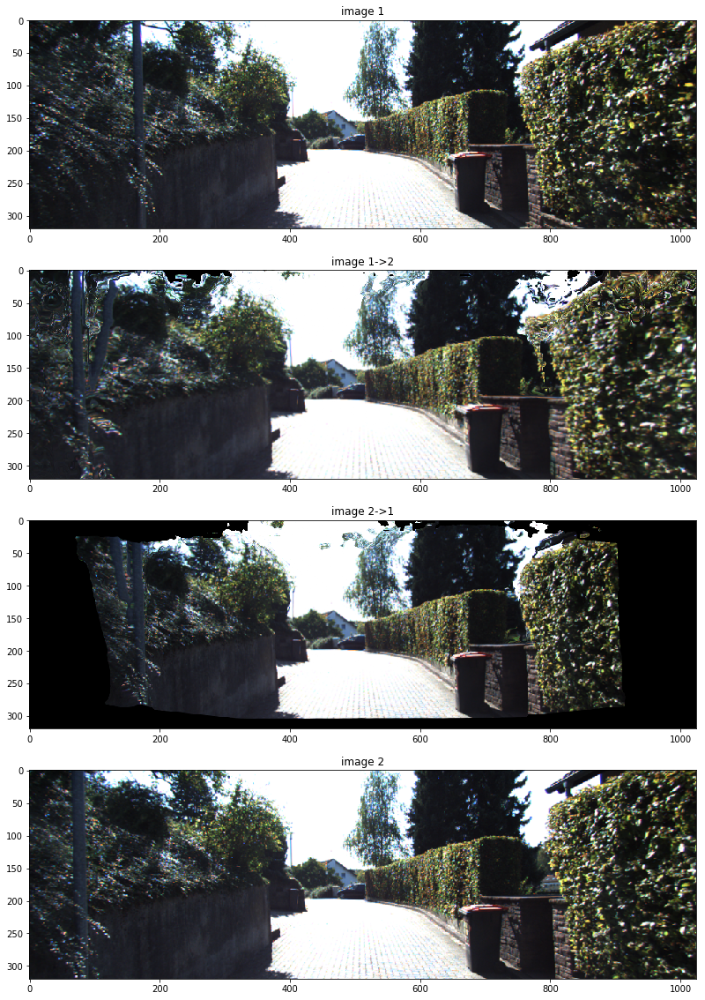

In [61]:
plt.figure(figsize=(20, 20))
plt.subplot(411)
plt.title('image 1')
plt.imshow(image1_resized)
plt.subplot(412)
plt.title('image 1->2')
plt.imshow(image_warped12)
plt.subplot(413)
plt.title('image 2->1')
plt.imshow(image_warped21)
plt.subplot(414)
plt.title('image 2')
plt.imshow(image2_resized)

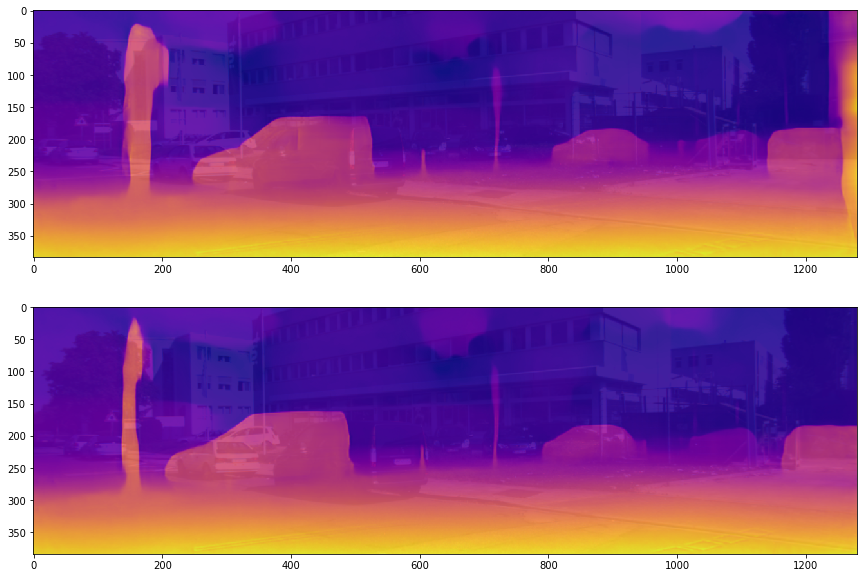

In [42]:
disp1 = cv2.resize(np.load('disp12.npy'), (1280, 384))
disp2 = cv2.resize(np.load('disp2.npy'), (1280, 384))

plt.figure(figsize=(20, 10))
plt.subplot(211)
plt.imshow(image1_resized)
plt.imshow(disp1, 'plasma', alpha=0.9)
plt.subplot(212)
plt.imshow(image2_resized)
plt.imshow(disp2, 'plasma', alpha=0.9)

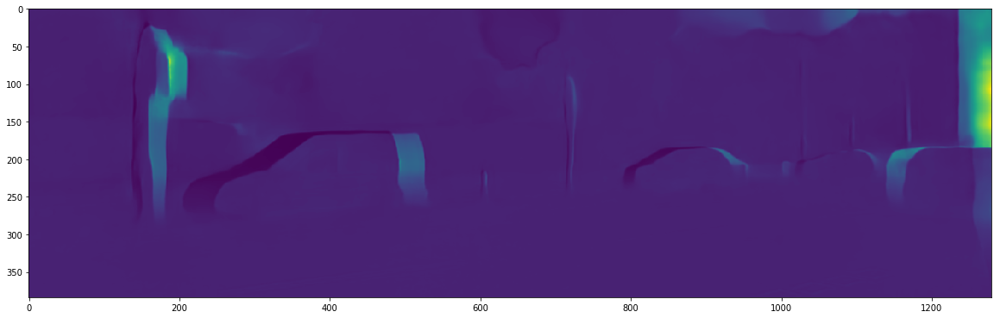

In [20]:
plt.figure(figsize=(20, 10))
plt.imshow(disp1/disp2)

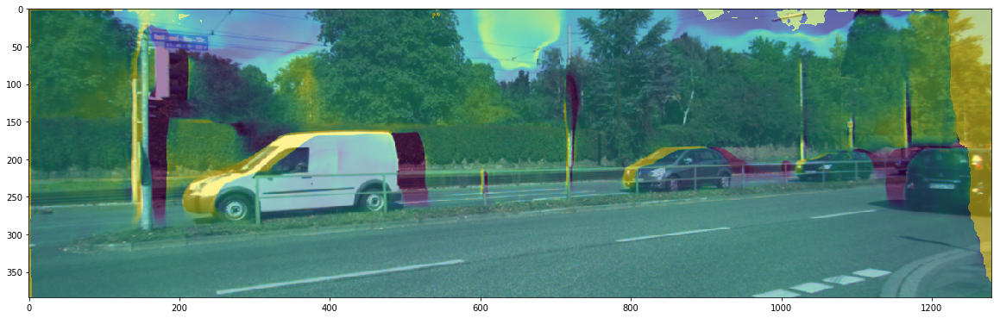

In [21]:
# mask1 = disp1/disp2 < 0.9 # which part to use image1 independent of flow
mask1 = 1/(1+np.exp(10*(disp1/disp2-1))) # soft mask
mask1[np.all(image_warped21==0, axis=-1)] = 1 # fill fly-out area
plt.figure(figsize=(20, 10))
plt.imshow(image2_resized)
plt.imshow(mask1, alpha=0.5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


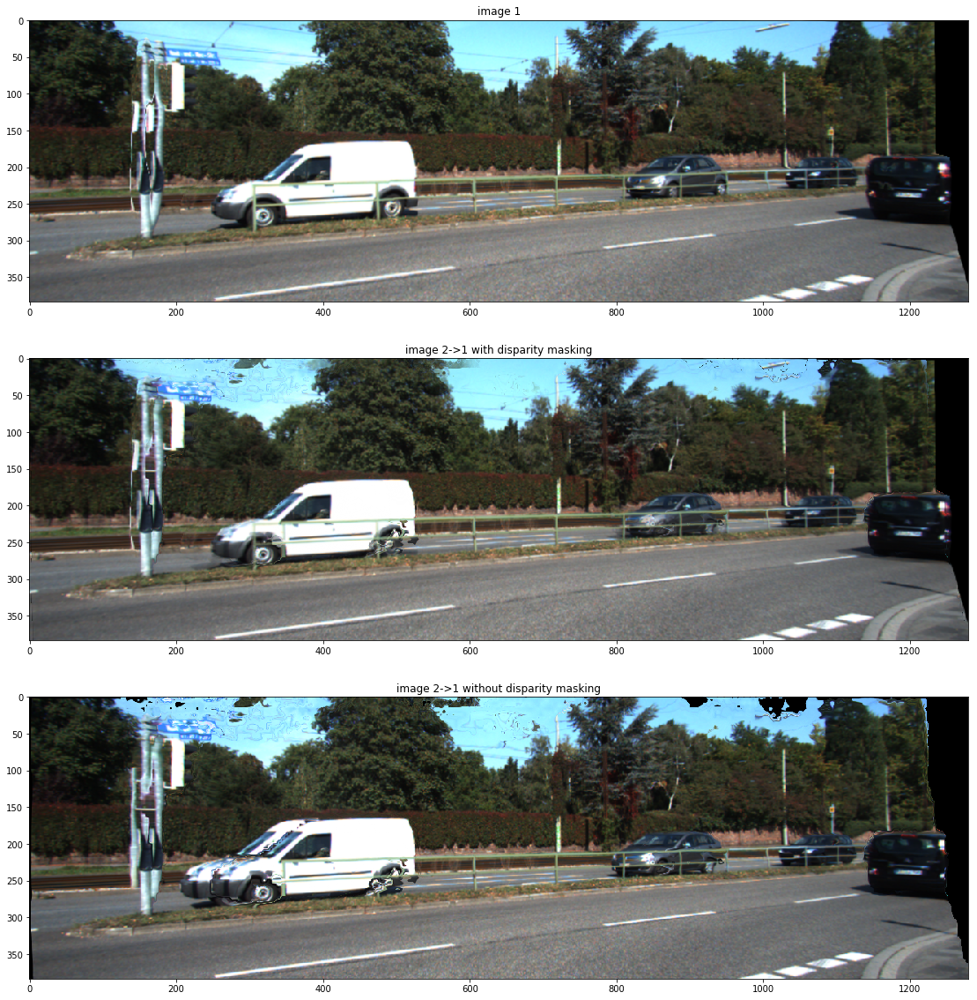

In [24]:
mask1_ = np.tile(mask1[:, :, np.newaxis], (1, 1, 3))
plt.figure(figsize=(20, 20))
plt.subplot(311)
plt.title('image 1')
plt.imshow(image1_resized)
plt.subplot(312)
plt.title('image 2->1 with disparity masking')
plt.imshow(image_warped21*(1-mask1_)+image1_resized/255.0*mask1_)
plt.subplot(313)
plt.title('image 2->1 without disparity masking')
plt.imshow(image_warped21)

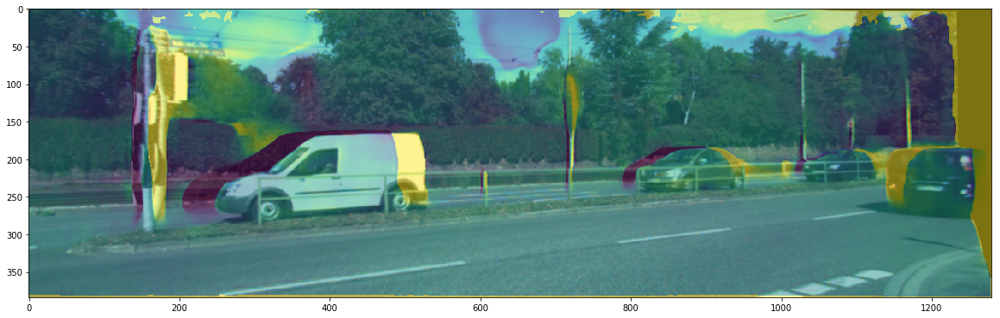

In [25]:
# mask2 = disp2/disp1 < 0.9
mask2 = 1/(1+np.exp(10*(disp2/disp1-1))) # soft mask
mask2[np.all(image_warped12==0, axis=-1)] = 1 # fill fly-out area
plt.figure(figsize=(20, 10))
plt.imshow(image1_resized)
plt.imshow(mask2, alpha=0.5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


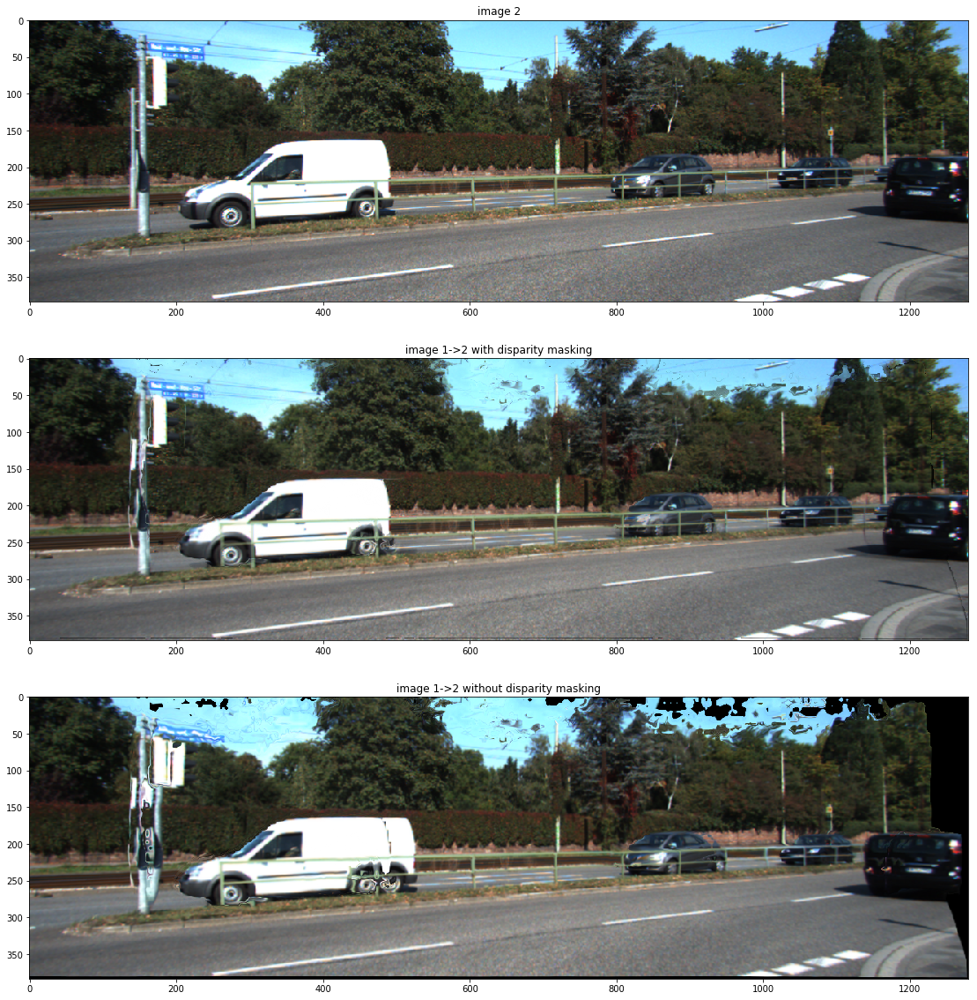

In [26]:
mask2_ = np.tile(mask2[:, :, np.newaxis], (1, 1, 3))
plt.figure(figsize=(20, 20))
plt.subplot(311)
plt.title('image 2')
plt.imshow(image2_resized)
plt.subplot(312)
plt.title('image 1->2 with disparity masking')
plt.imshow(image_warped12*(1-mask2_)+image2_resized/255.0*mask2_)
plt.subplot(313)
plt.title('image 1->2 without disparity masking')
plt.imshow(image_warped12)